# What is this doing
Takes the QC file I created from the raw Single Cell data and proccesses it in to clusters and subclusters.

## Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn

## Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_13752\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


## Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4, random_state=0):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=reso)
    sc.pl.umap(adata, color='leiden')

## Reading the excisting h5ad file I created previously in the QC pipeline 

In [4]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/human/''human_after_qc.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/human/''human_after_qc.h5ad')

AnnData object with n_obs × n_vars = 6608 × 27984
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

## Preprocessing the data 

In [5]:
adata

AnnData object with n_obs × n_vars = 6608 × 27984
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

In [6]:
adata.obs

,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase
AAACCCAGTTCGAAGG-1-control,control,1202,1202,2250.0,183.0,8.133333,-0.031040,-0.007591,G1
AAACGAAAGCTCGAAG-1-control,control,1250,1250,4820.0,491.0,10.186722,0.014368,0.028133,G2M
AAACGCTAGAATCGAT-1-control,control,853,852,2221.0,273.0,12.291760,0.037580,-0.081736,S
AAACGCTAGACACACG-1-control,control,1472,1472,4352.0,219.0,5.032169,-0.144998,-0.096755,G1
AAACGCTCAAAGGCGT-1-control,control,1422,1422,2742.0,291.0,10.612691,0.474150,0.021956,S
...,...,...,...,...,...,...,...,...,...
TTTGGTTCAGGATCTT-1-pic,pic,1693,1691,3841.0,366.0,9.528769,-0.103834,-0.064101,G1
TTTGGTTTCGGTAAGG-1-pic,pic,1026,1026,3240.0,249.0,7.685185,-0.071025,-0.057557,G1
TTTGGTTTCGTGTGGC-1-pic,pic,1546,1546,4774.0,677.0,14.180981,0.021841,-0.075093,S
TTTGTTGTCGATGCAT-1-pic,pic,776,775,1885.0,234.0,12.413793,-0.175906,-0.106105,G1


In [7]:
adata.var

,gene_ids,n_cells,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
nan_1,ENSG00000238009,56,False,56,0.002737,99.731054,57.0
nan_2,ENSG00000239945,4,False,4,0.000192,99.980790,4.0
CICP27,ENSG00000233750,9,False,9,0.000432,99.956776,9.0
nan_3,ENSG00000268903,45,False,45,0.002161,99.783882,45.0
nan_4,ENSG00000269981,3,False,3,0.000144,99.985592,3.0
...,...,...,...,...,...,...,...
nan_15734,ENSG00000278817,34,False,34,0.001633,99.836711,34.0
nan_15739,ENSG00000278384,89,False,89,0.004370,99.572567,91.0
nan_15742,ENSG00000276345,3,False,3,0.000144,99.985592,3.0
nan_15746,ENSG00000277856,5,False,5,0.000432,99.975987,9.0


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [14884 20055 27939] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


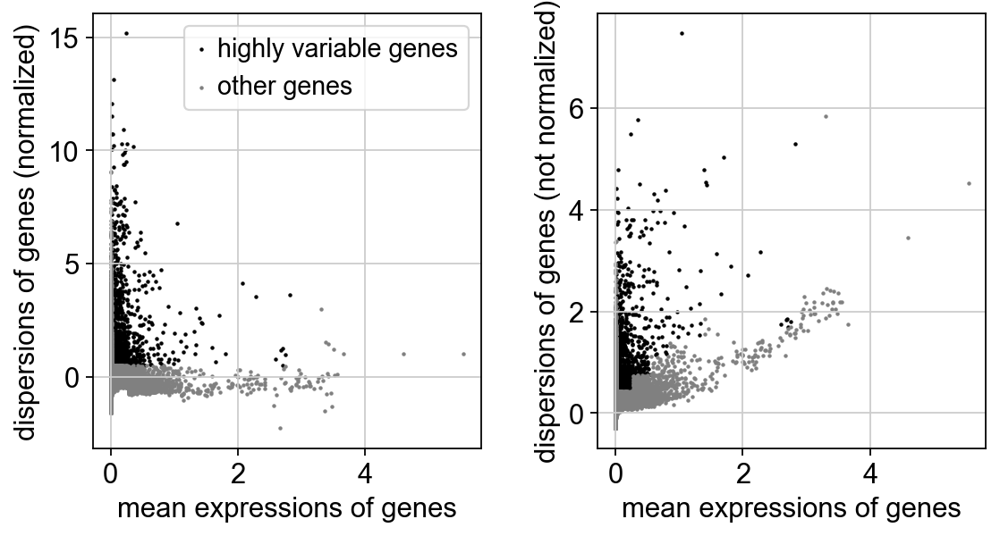

In [8]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
# adata = adata[:, adata.var.highly_variable] # For filtering non Highly variable genes. We usually keep all the genes. 

In [9]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:03:24)
    ... clipping at max_value 10
computing PCA
    with n_comps=50


c:\Python\Python310\lib\site-packages\scanpy\preprocessing\_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:03)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP


  0%|          | 0/500 [00:00<?, ?it/s]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:03)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
Memory usage: current 2.02 GB, difference +2.02 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


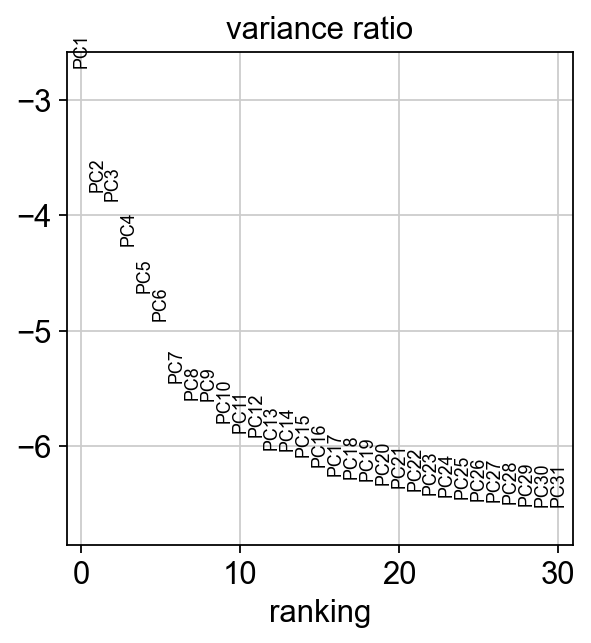

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP


  0%|          | 0/500 [00:00<?, ?it/s]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
running Leiden clustering


C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_13752\2800874316.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso)


    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


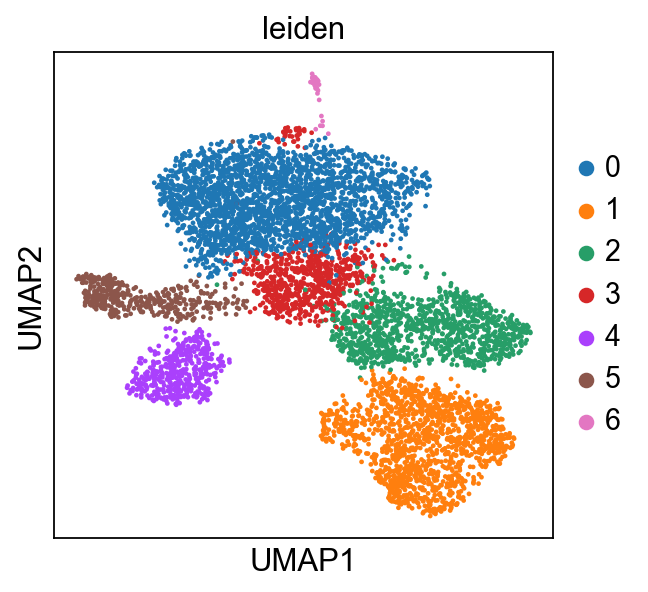

In [10]:
processing_batch(adata, key='treatment')

ranking genes
    consider 'treatment' groups:
    with sizes: [1632 2457 1336 1183]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


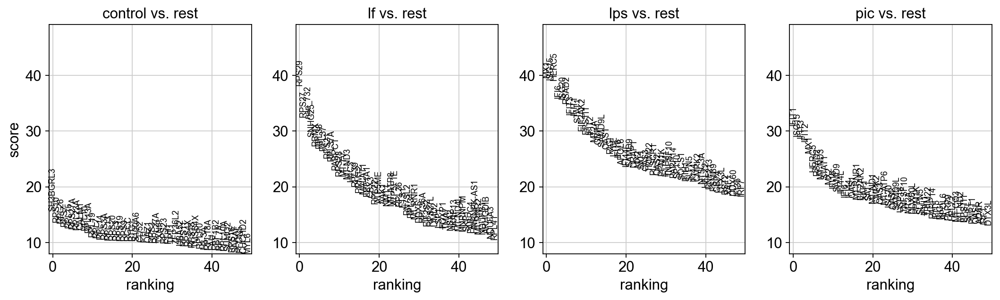

,control,lf,lps,pic
0,SH3BGRL3,RPS29,MX1,IFIT1
1,RPS10,RPS27,ISG15,ISG15
2,RPL26,nan_732,HERC5,IFIT3
3,RPS7,SNHG25,IFI6,IFIT2
4,RPL15,RBMX,ISG20,MX1
5,RPS27A,RPL38,RSAD2,HERC5
6,RPL23A,RPL37,IFIT3,RSAD2
7,CALM1,RPS21,IFIT1,MT-ND3
8,RPL10,RPL37A,STAT1,STAT1
9,RPL13A,PABPC1,EIF2AK2,MX2


In [11]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color = ['PLAC8', 'CD83', 'CD74', 'CD79B', 'CD38', 'IL10', 'CD7'], size=50)

In [12]:
adata.obs['treatment'].value_counts()

treatment
lf         2457
control    1632
lps        1336
pic        1183
Name: count, dtype: int64

## UMAP's

### T cells

In [ ]:
sc.pl.umap(adata, color=['CD3D','CD3E','CD3G','CD247','TCF7','GPR183','GPR171','CCR7','CD37','CD28'], size=30)
sc.pl.umap(adata, color='leiden', size=30)

### B cells

In [ ]:
sc.pl.umap(adata, color=['IGHM','CD79A','CD79B','PLAC8','CD74','CCR7','CD38'], size=30)

celltype = {'0':'T_cells','1':'1','2':'T_cells','3':'T_cells','4':'4','5':'5','6':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

### Monocytes

In [ ]:
sc.pl.umap(adata, color=['MRC1','CCL8','C1QA','TXN','MAFB','TYROBP','LYZ','SPI1','LGALS3','RGS2','CSTA','S100A4','CSF1R'], size=30)

celltype = {'0':'T_cells','1':'1','2':'T_cells','3':'T_cells','4':'B_cells','5':'5','6':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

### RBC

In [ ]:
sc.pl.umap(adata, color=['HBM','ALAS2'], size=30)

celltype = {'0':'T_cells','1':'1','2':'T_cells','3':'T_cells','4':'B_cells','5':'Monocytes','6':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

### Platelets

In [ ]:
sc.pl.umap(adata, color=['PLEK','CD36','SERPINE1','PECAM1','B2M'], size=30)

celltype = {'0':'T_cells','1':'1','2':'T_cells','3':'T_cells','4':'B_cells','5':'Monocytes','6':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

### All clusters

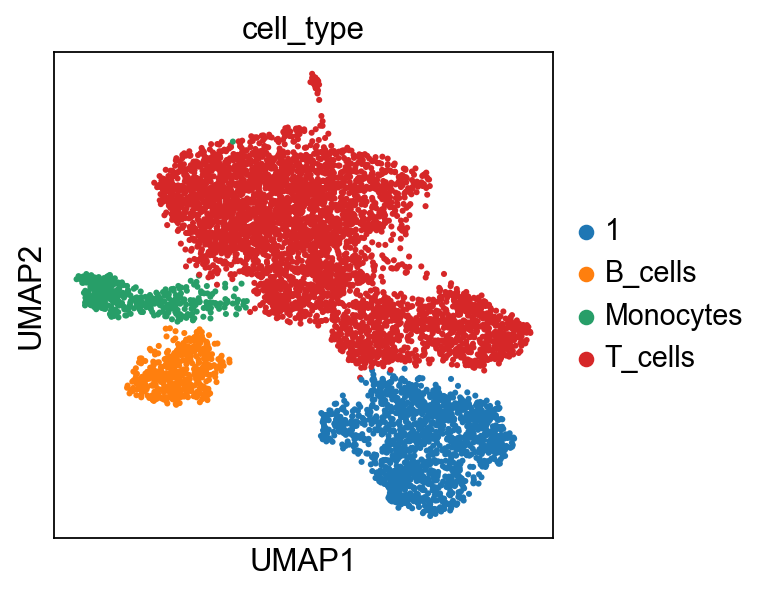

In [13]:
celltype = {'0':'T_cells','1':'1','2':'T_cells','3':'T_cells','4':'B_cells','5':'Monocytes','6':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

In [14]:
adata.obs['cell_type'].value_counts()

cell_type
T_cells      4307
1            1452
B_cells       440
Monocytes     409
Name: count, dtype: int64

### Main data after manipulations for presenation

In [34]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/human/ISG_genes_human.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

""
names
ADAR
AZI2
B2M
C2
CASP8
...
WARS2-IT1
XAF1
ZC3HAV1


In [35]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

['ADAR',
 'AZI2',
 'B2M',
 'C2',
 'CASP8',
 'CD274',
 'CD47',
 'CMPK2',
 'CMTR1',
 'DHX58',
 'DNAJA1',
 'DNAJC13',
 'DTX3L',
 'EHD4',
 'EIF2AK2',
 'ERAP1',
 'FMR1',
 'HERC6',
 'IFI35',
 'IFIH1',
 'IFIT2',
 'IFIT3',
 'IL15RA',
 'IRF1',
 'IRF7',
 'IRF9',
 'ISG15',
 'ISG20',
 'LGALS9',
 'MORC3',
 'MOV10',
 'MX1',
 'MYD88',
 'N4BP1',
 'NLRC5',
 'NMI',
 'NUB1',
 'OAS1',
 'OAS2',
 'OAS3',
 'OASL',
 'PARP12',
 'PARP14',
 'PARP9',
 'PML',
 'PSMB10',
 'PSMB8',
 'PSMB9',
 'PSME1',
 'PSME2',
 'RBCK1',
 'RFX5',
 'RICTOR',
 'RNF114',
 'RNF19B',
 'RNF213',
 'RNF31',
 'RSAD2',
 'SAT1',
 'SERTAD1',
 'SHISA5',
 'SLC25A28',
 'SOCS1',
 'SP110',
 'STAT1',
 'STAT2',
 'TDRD7',
 'TNFSF10',
 'TRAFD1',
 'TRIM21',
 'TRIM25',
 'UBA7',
 'UBE2L6',
 'USP18',
 'USP25',
 'WARS1',
 'WARS2',
 'WARS2-AS1',
 'WARS2-IT1',
 'XAF1',
 'ZC3HAV1',
 'ZCCHC2',
 'ZNFX1']

#### UMAP's of the ISG genes

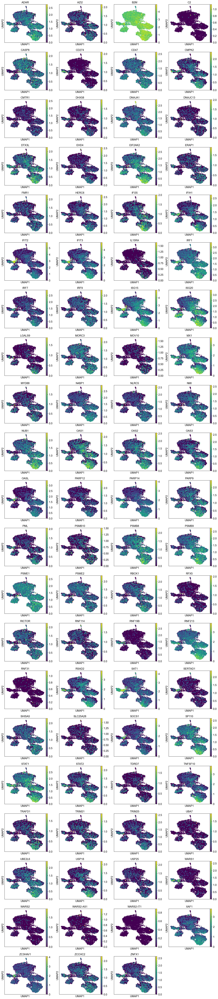

In [36]:
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in Human cells

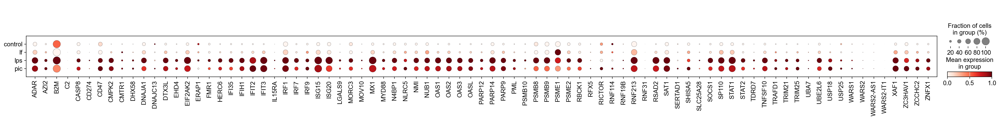

In [37]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

#### TLR genes in adata by treatment

In [39]:
TLR_genes = ['TLR5','TLR9','TLR10','TLR1','TLR6','TLR2','TLR3','TLR7','TLR8','TLR4']

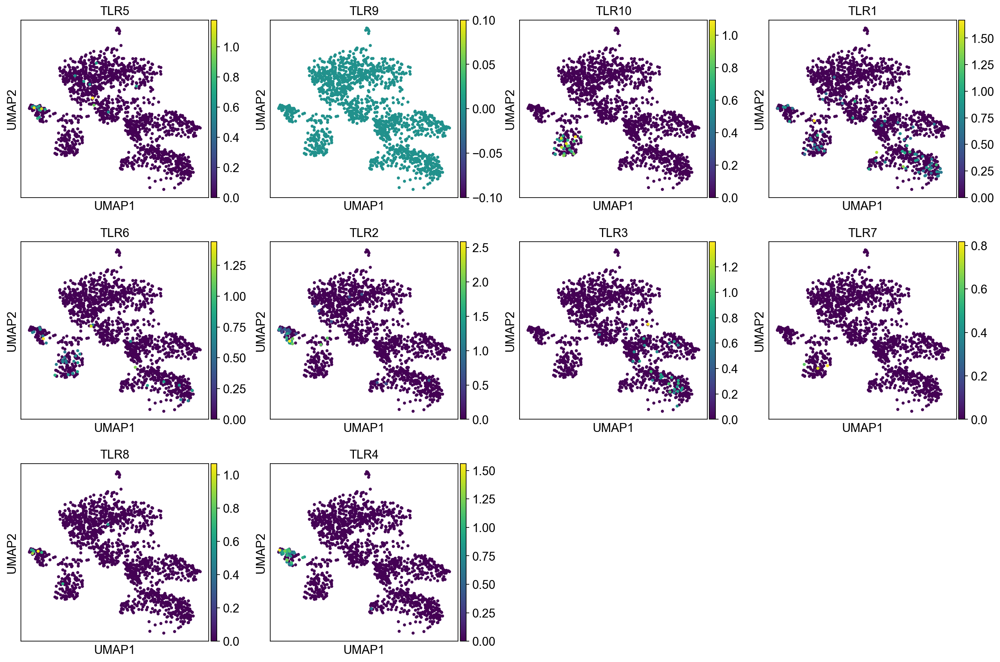

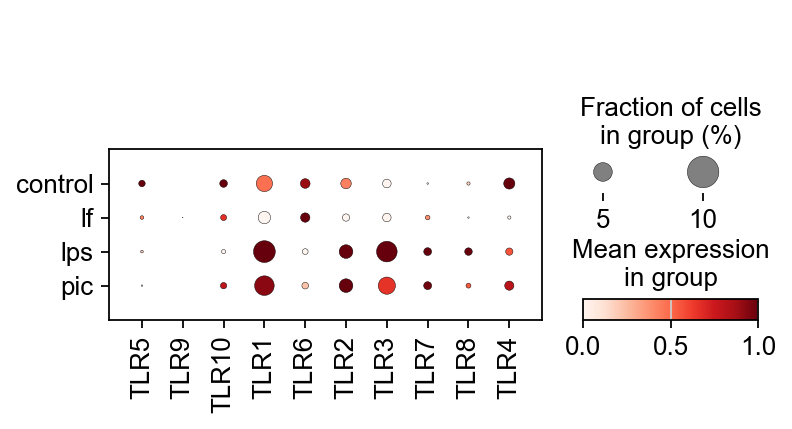

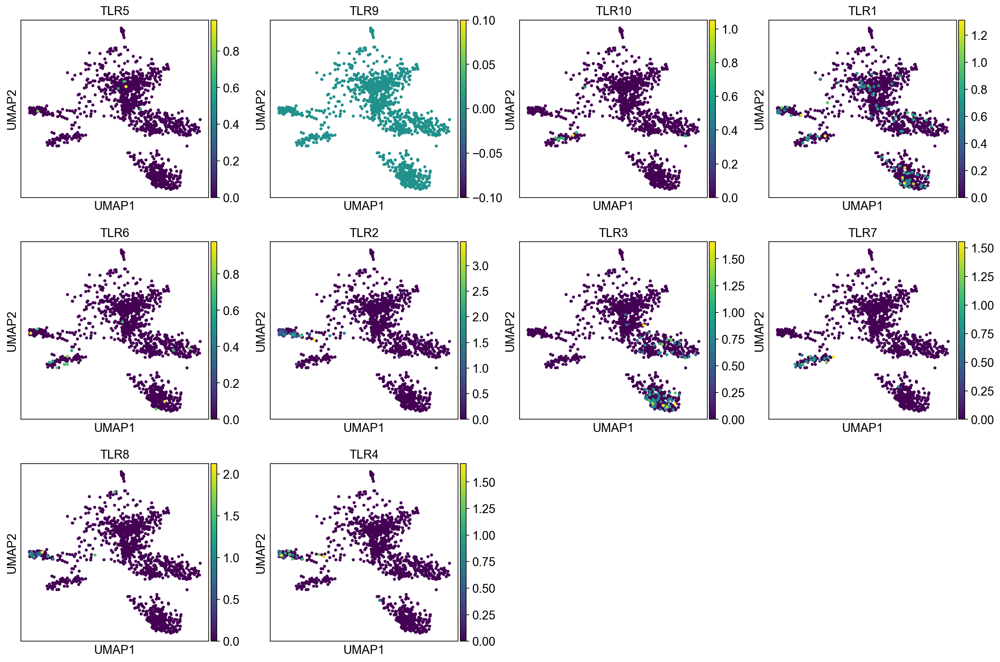

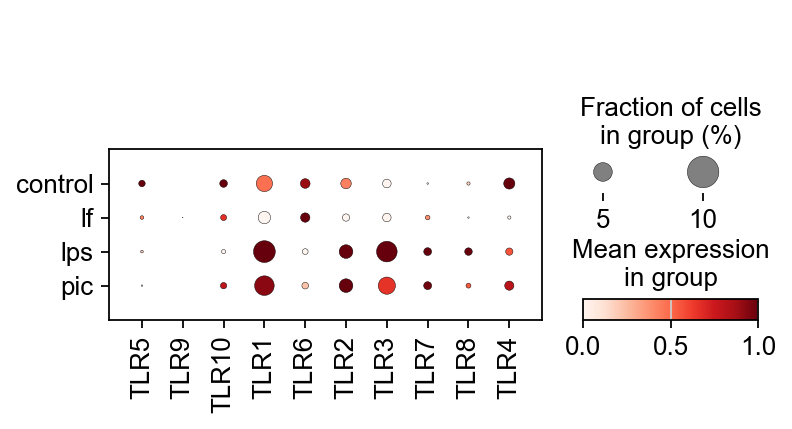

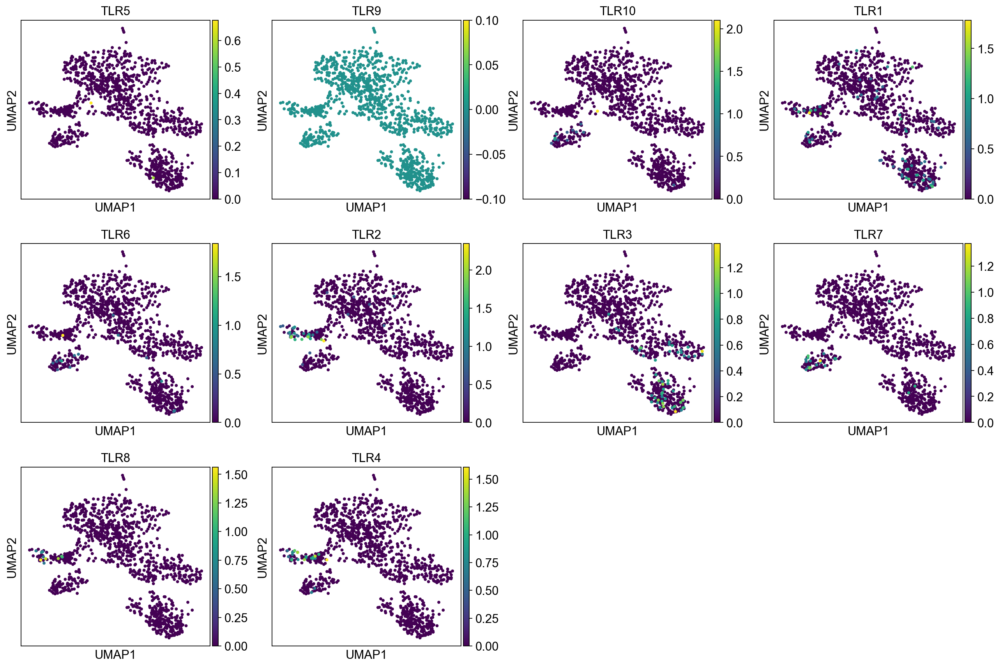

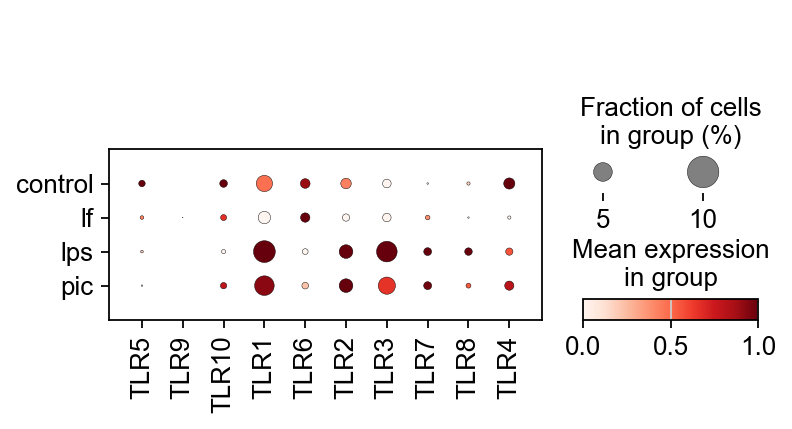

In [40]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [38]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('tlr')

['TLR5',
 'TLR9',
 'TLR10',
 'TLR1',
 'TLR6',
 'TLR2',
 'TLR3',
 'TLR7',
 'TLR8',
 'TLR4']